In [1]:
import torch
from PIL import Image
import numpy as np
import h5py
from scipy.io import loadmat
import pickle
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import shapely.affinity
import shapely.geometry
from skimage.draw import polygon
from skimage.morphology import convex_hull_image
from skimage.filters import gaussian as smoothing
from torchvision import datasets, transforms

from lucent.optvis import render, transform
from lucent.modelzoo import inceptionv1_avgPool
from lucent.misc.io import show
from lucent.util import set_seed

from helper import load_crop, gaussian, moments, fitgaussian, text_synth_param, text_synth_param_occluder, activation_difference, gram_matrix, rgb2gray, text_synth_param_occluder_noimg
from io import BytesIO
from urllib.request import urlopen

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1_avgPool(pretrained=True)
_ = model.to(device).eval()

/home/stijn/.local/lib/python3.6/site-packages/torch/cuda/__init__.py:120: UserWarning: 
    Found GPU%d %s which is of cuda capability %d.%d.
    PyTorch no longer supports this GPU because it is too old.
    The minimum cuda capability supported by this library is %d.%d.
    
  warnings.warn(old_gpu_warn.format(d, name, major, minor, min_arch // 10, min_arch % 10))


In [3]:
layers = ['conv2d2','mixed4a','mixed4d']
seed = 0
pic_size = 256
safe_margin = 30
stim_size = 500
final_size = 768
#roi_names = ['1','2','3','4','5','7','8','9','10','11','12']
roi_names = ['1','2','3','4','5','7','8','9','10']
shift_x = 100
shift_y = 100

all_transforms = [
    transform.jitter(4),
    #transforms.Grayscale(3),
    transform.random_rotate(list(range(-5,5))),
]

all_transforms = [
    #transform.pad(2),
    transform.jitter(8),
    transform.random_scale([n/1000. for n in range(975, 1050)]),
    transform.random_rotate(list(range(-5,5))),
    transform.jitter(4)
]

In [4]:
all_centrex = []
all_centrey = []
all_szx = []
all_szy = []
for roi_name in roi_names:
    data_path = 'Data/array' + roi_name + '_good_rfs' + '.mat'
    data_dict = {}
    f = loadmat(data_path)
    for k, v in f.items():
        data_dict[k] = np.array(v)
    all_centrex.append(data_dict['centrex'][0])    
    all_centrey.append(data_dict['centrey'][0])
    all_szx.append(data_dict['szx'][0])
    all_szy.append(data_dict['szy'][0])

all_centrex = np.asarray(all_centrex)
all_centrey = np.asarray(all_centrey)
all_szx = np.asarray(all_szx)
all_szy = np.asarray(all_szy)

/home/stijn/.local/lib/python3.6/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [6]:
mask_size = final_size
#np.int(np.floor(stim_size/final_size*pic_size))
mask = np.ones(shape=(mask_size,mask_size), dtype="bool")
fovea_x = final_size/2
fovea_y = final_size/2
for n in range(all_centrex.shape[0]):
    for m in range(all_centrex[n].shape[0]):

        x = all_centrex[n][m] + fovea_x
        y = -all_centrey[n][m] + fovea_y
        width_x = all_szx[n][m]
        width_y = all_szy[n][m]
        
        # create binary mask summing up the estimated 2d Gaussians (95% CI) + 1 degree of margin
        circ = shapely.geometry.Point((x,y)).buffer(1)
        ell  = shapely.affinity.scale(circ, width_x+safe_margin, width_y+safe_margin)
        ell_coords = np.array(list(ell.exterior.coords))
        cc, rr = polygon(ell_coords[:,0], ell_coords[:,1], mask.shape)
        mask[rr,cc] = False


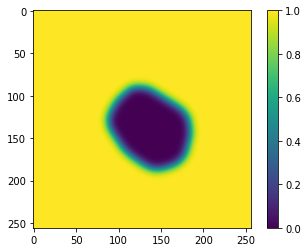

In [7]:
# make occluder by taking convexhull + smoothing the borders (half degree sigma)
mask = 1-convex_hull_image(1-mask)
mask = smoothing(mask,safe_margin/2)
mask = (mask-np.abs(mask.min()))/(np.abs(mask.max())-np.abs(mask.min()))
#mask = np.pad(mask,np.int((pic_size-mask_size)/2),mode='edge')
mask = np.array(Image.fromarray(mask).resize([pic_size,pic_size]))
occluder = np.repeat(mask[:,:,np.newaxis],3,2)
plt.imshow(mask)
plt.colorbar()

100%|██████████| 128/128 [00:04<00:00, 26.26it/s]



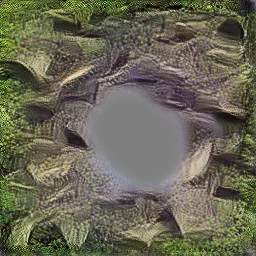
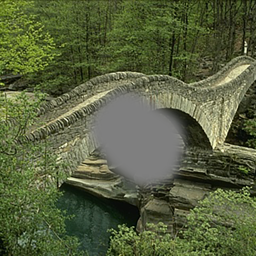

100%|██████████| 128/128 [00:07<00:00, 17.92it/s]



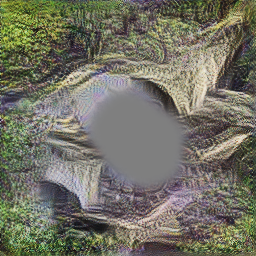
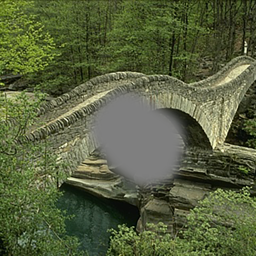

100%|██████████| 128/128 [00:08<00:00, 14.40it/s]



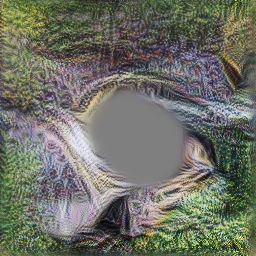
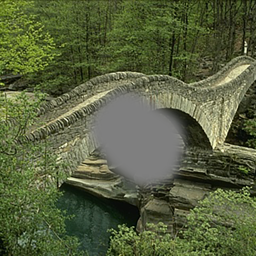

100%|██████████| 128/128 [00:04<00:00, 27.06it/s]



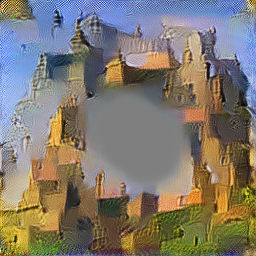
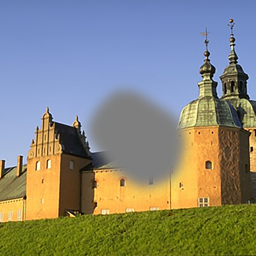

100%|██████████| 128/128 [00:07<00:00, 17.62it/s]



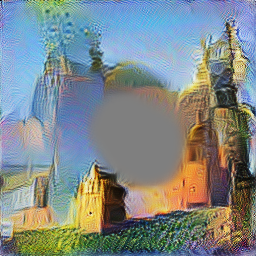
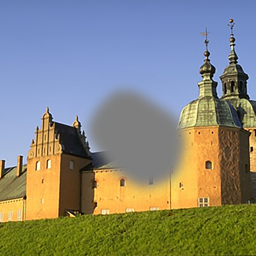

100%|██████████| 128/128 [00:08<00:00, 14.42it/s]



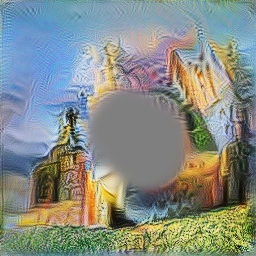
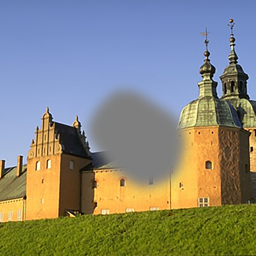

100%|██████████| 128/128 [00:04<00:00, 26.23it/s]



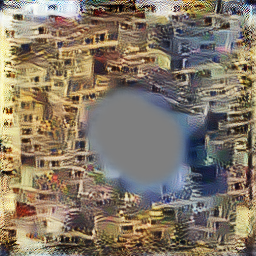
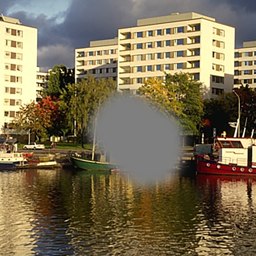

100%|██████████| 128/128 [00:07<00:00, 17.51it/s]



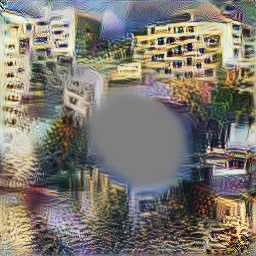
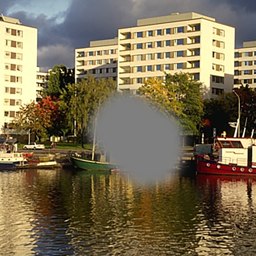

100%|██████████| 128/128 [00:08<00:00, 14.43it/s]



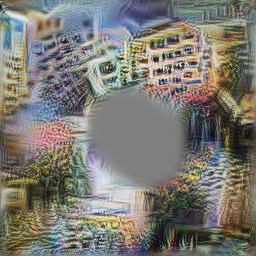
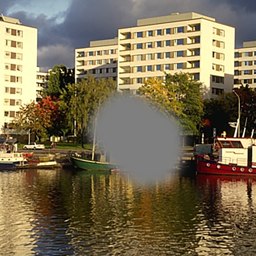

100%|██████████| 128/128 [00:04<00:00, 26.05it/s]



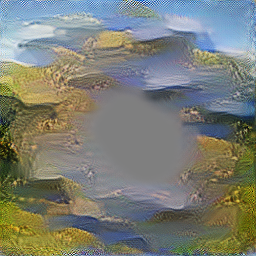
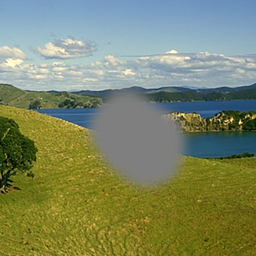

100%|██████████| 128/128 [00:07<00:00, 17.37it/s]



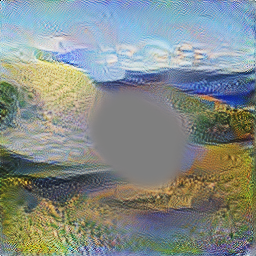
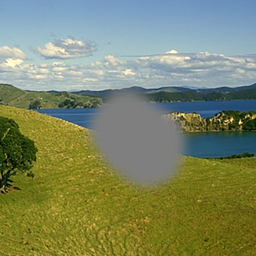

100%|██████████| 128/128 [00:09<00:00, 14.10it/s]



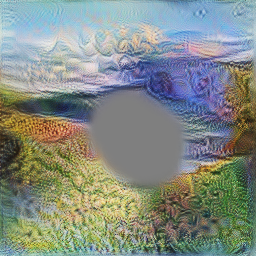
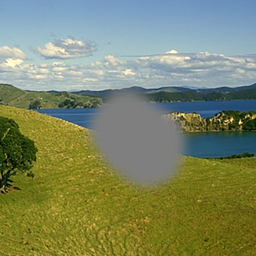

100%|██████████| 128/128 [00:04<00:00, 25.78it/s]



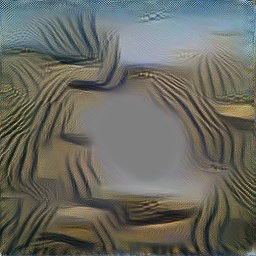
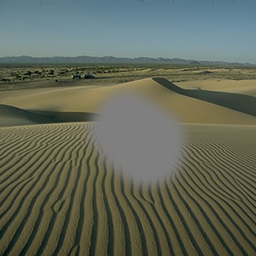

100%|██████████| 128/128 [00:07<00:00, 17.30it/s]



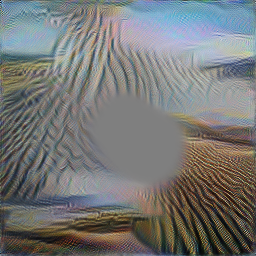
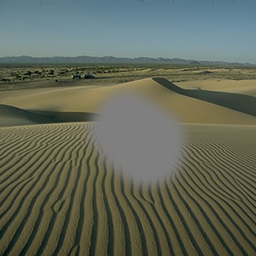

100%|██████████| 128/128 [00:09<00:00, 14.07it/s]



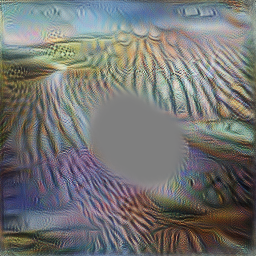
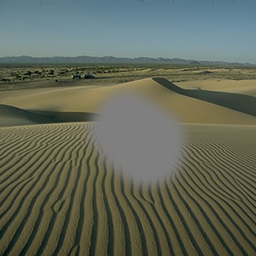

100%|██████████| 128/128 [00:05<00:00, 25.45it/s]



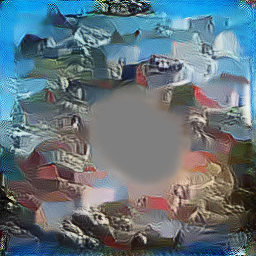
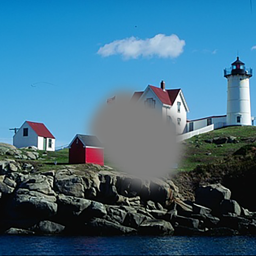

100%|██████████| 128/128 [00:07<00:00, 17.25it/s]



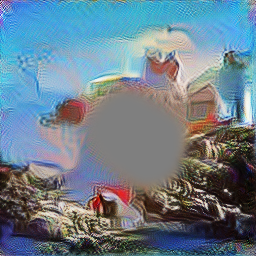
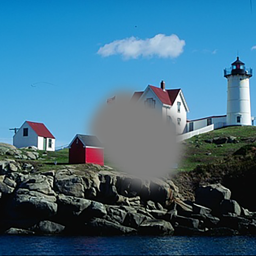

100%|██████████| 128/128 [00:09<00:00, 14.21it/s]



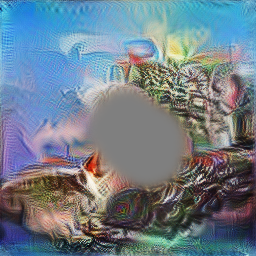
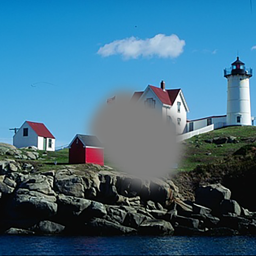

100%|██████████| 128/128 [00:05<00:00, 24.88it/s]



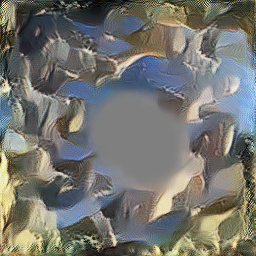
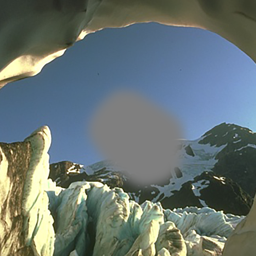

100%|██████████| 128/128 [00:07<00:00, 17.01it/s]



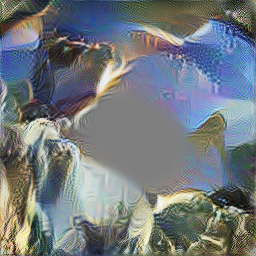
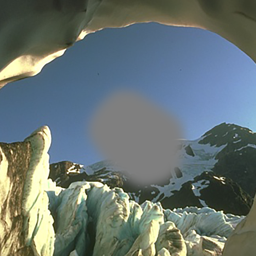

100%|██████████| 128/128 [00:09<00:00, 13.90it/s]



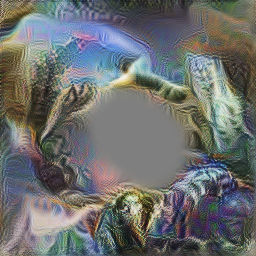
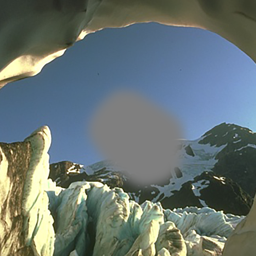

100%|██████████| 128/128 [00:05<00:00, 25.10it/s]



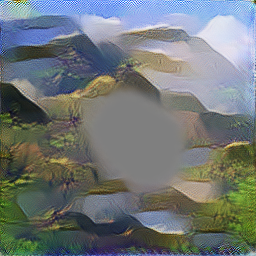
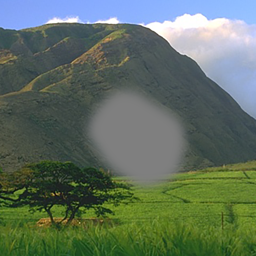

100%|██████████| 128/128 [00:07<00:00, 17.37it/s]



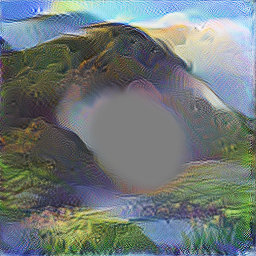
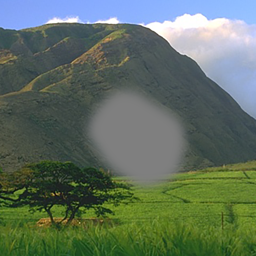

100%|██████████| 128/128 [00:09<00:00, 13.89it/s]



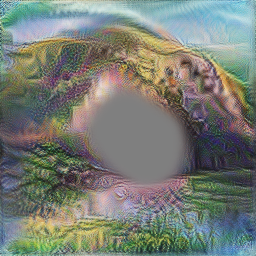
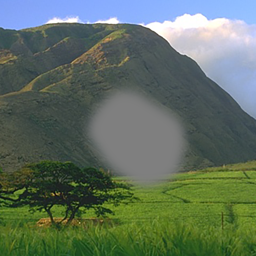

100%|██████████| 128/128 [00:05<00:00, 24.76it/s]



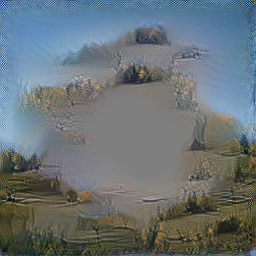
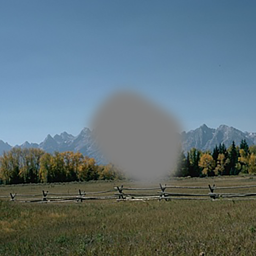

100%|██████████| 128/128 [00:07<00:00, 16.86it/s]



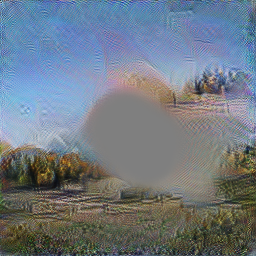
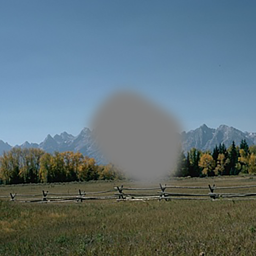

100%|██████████| 128/128 [00:09<00:00, 13.66it/s]



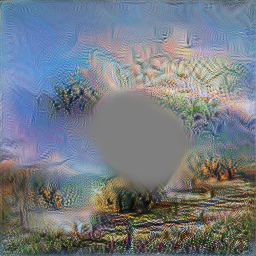
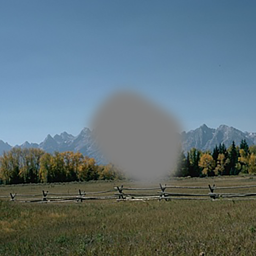

100%|██████████| 128/128 [00:05<00:00, 24.58it/s]



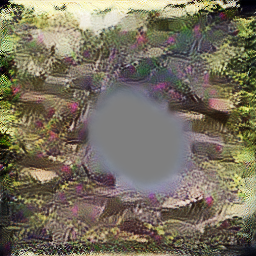
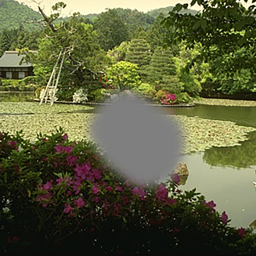

100%|██████████| 128/128 [00:07<00:00, 16.82it/s]



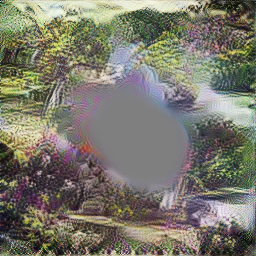
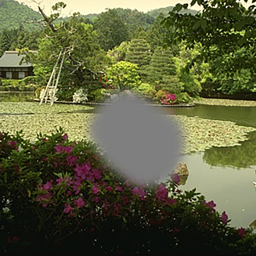

100%|██████████| 128/128 [00:09<00:00, 13.76it/s]



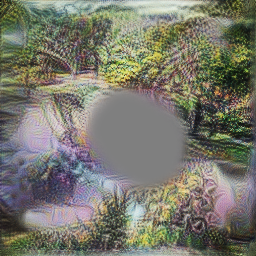
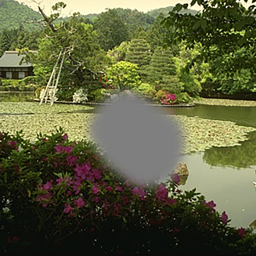

In [8]:
for n in range(10):
    pic_name = str(n+11)
    target_img = load_crop("temp_occ_pics/pic_"+pic_name+".png",pic_size)
    out_shape = target_img.shape[:2]
    param_f = lambda: text_synth_param_occluder(target_img, occluder, device)
    for lay in layers:
        set_seed(seed)
        objective = activation_difference([lay], transform_f=gram_matrix)
        vis = render.render_vis(model, objective, param_f, show_inline=True, transforms=all_transforms,thresholds=(128,))
        
        if lay == layers[0]:
            filename = "metamers/pic_" + pic_name + "_intact" + '.bmp'
            temp = vis[0][1]
            temp_pic = Image.fromarray(np.uint8((temp)*255))
            temp_pic = temp_pic.resize((final_size,final_size),Image.BILINEAR)
            temp_pic.save(filename)
        
        filename = "metamers/pic_" + pic_name + "_" + lay + '.bmp'
        temp = vis[0][0]
        temp_pic = Image.fromarray(np.uint8((temp)*255))
        temp_pic = temp_pic.resize((final_size,final_size),Image.BILINEAR)
        temp_pic.save(filename)

####TEST


In [5]:
stim_path = '/media/stijn/2bb74e85-3681-4561-88b7-abd98482de61/paolo/Data/'

In [6]:
mask_test = load_crop(stim_path + 'zebra.png',pic_size)
pic_test = load_crop(stim_path + 'zebra.jpg',pic_size)
mask = mask_test[:,:,0];
occluder = np.repeat(mask[:,:,np.newaxis],3,2)

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

gray = rgb2gray(pic_test) 
gray = np.repeat(gray[:,:,np.newaxis],3,2)


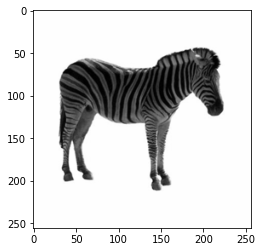

In [7]:
plt.imshow(gray)

100%|██████████| 128/128 [00:08<00:00, 15.40it/s]



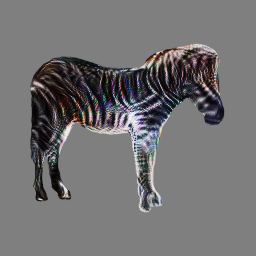
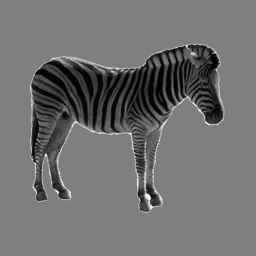

In [15]:
param_f = lambda: text_synth_param_occluder(gray, occluder, device)
for lay in layers:
    set_seed(seed)
    objective = activation_difference([lay], transform_f=gram_matrix)
    vis = render.render_vis(model, objective, param_f, show_inline=True, transforms=all_transforms, thresholds=(128,))

100%|██████████| 64/64 [00:04<00:00, 14.70it/s]



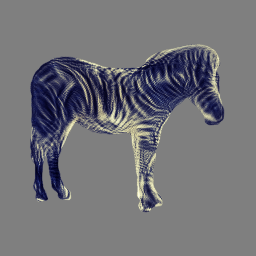
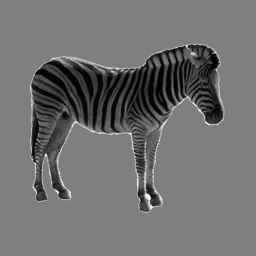

In [127]:
param_f = lambda: text_synth_param_occluder(gray, occluder, device)
for lay in layers:
    set_seed(seed)
    objective = activation_difference([lay], transform_f=gram_matrix)
    vis = render.render_vis(model, objective, param_f, show_inline=True, transforms=all_transforms, thresholds=(64,))

In [128]:
filename = stim_path + "meta_zebra" + '.bmp'
temp = vis[0][0]
temp_pic = Image.fromarray(np.uint8((temp)*255))
temp_pic = temp_pic.resize((final_size,final_size),Image.BILINEAR)
temp_pic.save(filename)

In [6]:
mask_test = load_crop(stim_path + 'tiger.png',pic_size)
pic_test = load_crop(stim_path + 'giraffe.jpg',pic_size)
mask = mask_test[:,:,0];
occluder = np.repeat(mask[:,:,np.newaxis],3,2)

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

gray = rgb2gray(pic_test) 
gray = np.repeat(gray[:,:,np.newaxis],3,2)


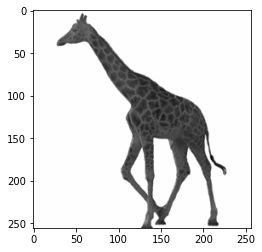

In [7]:
plt.imshow(gray)

100%|██████████| 32/32 [00:02<00:00, 15.51it/s]



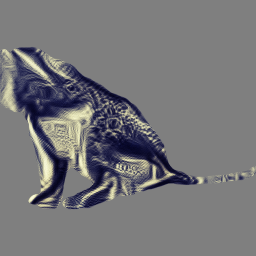
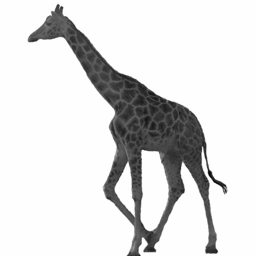

In [11]:
param_f = lambda: text_synth_param_occluder_noimg(gray, occluder, device)
for lay in layers:
    set_seed(seed)
    objective = activation_difference([lay], transform_f=gram_matrix)
    vis = render.render_vis(model, objective, param_f, show_inline=True, transforms=all_transforms, thresholds=(32,))

In [137]:






filename = stim_path + "meta_tiger2" + '.bmp'
temp = vis[0][0]
temp_pic = Image.fromarray(np.uint8((temp)*255))
temp_pic = temp_pic.resize((final_size,final_size),Image.BILINEAR)
temp_pic.save(filename)